In [1]:
pip install timm open3d

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.4/42.4 kB 562.3 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 13.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 399.7/399.7 MB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.5/7.5 MB 81.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.8/139.8 kB 9.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 65.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 58.9 MB/s eta 0:00:00
  Attempting uninstall: widgetsnbextension
    Found existing installation: widgetsnbextension 3.6.9
    Uninstalling widgetsnbextension-3.6.9:
      Successfully uninstalled widgetsnbextension-3.6.9
  Attempting uninstall: ipywidgets
    Found existing installation: ipywidgets 7.7.1
    Uninstalling ipywidgets-7.7.1:
      Successfully uninstalled ipywidgets-7.7.1


# IMPORT THE NECESSARY MODULES

In [2]:
import cv2
import torch
import os

import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
import numpy as np
import open3d as o3d
import plotly.graph_objects as go




# SELECT THE MODEL TYPE FOR DEPTH ESTIMATION

In [ ]:
model_type = "DPT_Large"     # MiDaS v3 - Large     (highest accuracy, slowest inference speed)
#model_type = "DPT_Hybrid"   # MiDaS v3 - Hybrid    (medium accuracy, medium inference speed)
#model_type = "MiDaS_small"  # MiDaS v2.1 - Small   (lowest accuracy, highest inference speed)

midas = torch.hub.load("intel-isl/MiDaS", model_type)

Using cache found in /root/.cache/torch/hub/intel-isl_MiDaS_master


# SETTING UP DEVICE

In [ ]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
midas.to(device)
midas.eval()

DPTDepthModel(
  (pretrained): Module(
    (model): VisionTransformer(
      (patch_embed): PatchEmbed(
        (proj): Conv2d(3, 1024, kernel_size=(16, 16), stride=(16, 16))
        (norm): Identity()
      )
      (pos_drop): Dropout(p=0.0, inplace=False)
      (patch_drop): Identity()
      (norm_pre): Identity()
      (blocks): Sequential(
        (0): Block(
          (norm1): LayerNorm((1024,), eps=1e-06, elementwise_affine=True)
          (attn): Attention(
            (qkv): Linear(in_features=1024, out_features=3072, bias=True)
            (q_norm): Identity()
            (k_norm): Identity()
            (attn_drop): Dropout(p=0.0, inplace=False)
            (proj): Linear(in_features=1024, out_features=1024, bias=True)
            (proj_drop): Dropout(p=0.0, inplace=False)
          )
          (ls1): Identity()
          (drop_path1): Identity()
          (norm2): LayerNorm((1024,), eps=1e-06, elementwise_affine=True)
          (mlp): Mlp(
            (fc1): Linear(in_featur

# INITIALIZE MIDAS TRANSFORMS FOR DEPTH ESTIMATION

In [ ]:
midas_transforms = torch.hub.load("intel-isl/MiDaS", "transforms")

if model_type == "DPT_Large" or model_type == "DPT_Hybrid":
    transform = midas_transforms.dpt_transform
else:
    transform = midas_transforms.small_transform

Using cache found in /root/.cache/torch/hub/intel-isl_MiDaS_master


# PREPROCESS OF THE IMAGE BEFORE DEPTH ESTIMATION

In [ ]:
# Assuming you have an input image 'input_image' and an edge map 'edge_map'
input_image = cv2.imread("/content/roiselect.tif")
input_image = cv2.cvtColor(input_image, cv2.COLOR_BGR2RGB)

# Apply edge detection (e.g., Canny) to get the edge map
edge_map = cv2.Canny(input_image, threshold1=100, threshold2=200)

# Convert edge_map to a 3 channel image
edge_map_3channel = cv2.cvtColor(edge_map, cv2.COLOR_GRAY2RGB)

# Blend the edge map with the original image
# The weights can be adjusted as needed
alpha = 0.8  # Weight for the original image
beta = 1 - alpha  # Weight for the edge map
gamma = 0  # Scalar added to each sum

enhanced_image = cv2.addWeighted(input_image, alpha, edge_map_3channel, beta, gamma)

input_batch = transform(enhanced_image).to(device)


# PERFORM DEPTH ESTIMATION

In [ ]:
with torch.no_grad():
    prediction = midas(input_batch)

    prediction = torch.nn.functional.interpolate(
        prediction.unsqueeze(1),
        size=enhanced_image.shape[:2],
        mode="bicubic",
        align_corners=False,
    ).squeeze()

depth_image = prediction.cpu().numpy()

# SHOW THE DEPTH RESULT

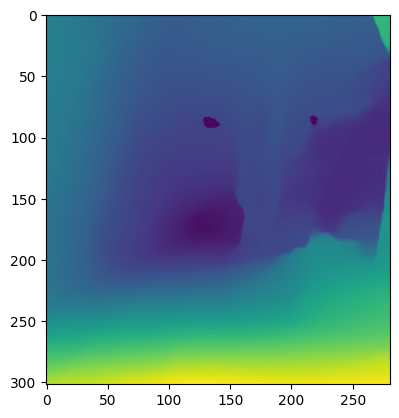

In [ ]:
plt.imshow(depth_image)
# plt.show()

# DEPTH-IMAGE TO POINT CLOUD FORMATION (DIRECTLY)

In [ ]:

# Load your depth map (replace with actual depth data)
depth_image = depth_image  # Load depth map (in meters)

# Load your RGB image (replace with actual image)
rgb_image = cv2.imread('/content/roiselect.tif')  # Load RGB image

# Ensure both images have the same dimensions
if rgb_image.shape[:2] != depth_image.shape:
    rgb_image = cv2.resize(rgb_image, (depth_image.shape[1], depth_image.shape[0]))  # Resize RGB image to match depth image

width = depth_image.shape[1]
height = depth_image.shape[0]
fx = 1000
fy = 1000
cx = width / 2
cy = height / 2

# Create intrinsic camera parameters (replace with actual values)
intrinsic = o3d.camera.PinholeCameraIntrinsic(width, height, fx, fy, cx, cy)

# Convert NumPy arrays to Open3D Images
color_raw = o3d.geometry.Image(rgb_image)
depth_raw = o3d.geometry.Image(depth_image)

# Create an empty list to store the 3D points and colors
points = []
colors = []

# Iterate over each pixel in the depth image
for v in range(height):
    for u in range(width):
        depth = depth_image[v, u]
        if depth > 0:  # Ignore zero depth values
            x = (u - cx) * depth / fx
            y = (v - cy) * depth / fy
            z = depth
            points.append([x, y, z])
            colors.append(rgb_image[v, u] / 255.0)  # Normalize RGB values to [0, 1]

# Convert the lists to numpy arrays
points = np.array(points)
colors = np.array(colors)

# Convert point cloud coordinates to meters (if not already in meters)
scaling_factor = 1.0  # Adjust this factor if your depth_image is not in meters
points = points * scaling_factor

# Create an Open3D point cloud from the numpy arrays
point_cloud = o3d.geometry.PointCloud()
point_cloud.points = o3d.utility.Vector3dVector(points)
point_cloud.colors = o3d.utility.Vector3dVector(colors)

# Visualize the point cloud (optional)
o3d.visualization.draw_geometries([point_cloud])

# Save the point cloud
o3d.io.write_point_cloud("output_point_cloud.ply", point_cloud)


[Open3D WARNING] GLFW Error: X11: The DISPLAY environment variable is missing
[Open3D WARNING] Failed to initialize GLFW
[Open3D WARNING] [DrawGeometries] Failed creating OpenGL window.


True

# SHOW THE POINT CLOUD

In [ ]:
print("Load a ply point cloud, print it, and render it")
ply_point_cloud = "/content/output_point_cloud.ply"
pcd = o3d.io.read_point_cloud(ply_point_cloud)
points = np.asarray(pcd.points)
print(pcd)
print(np.asarray(pcd.points))
colors = None
if pcd.has_colors():
    colors = np.asarray(pcd.colors)
elif pcd.has_normals():
    colors = (0.5, 0.5, 0.5) + np.asarray(pcd.normals) * 0.5
fig = go.Figure(
  data=[
    go.Scatter3d(
      x=points[:,0], y=points[:,1], z=points[:,2],
      mode='markers',
      marker=dict(size=1, color=colors)
)
],
  layout=dict(
    scene=dict(
      xaxis=dict(visible=False),
      yaxis=dict(visible=False),
      zaxis=dict(visible=False)
)
)
)
fig.show()


Load a ply point cloud, print it, and render it
PointCloud with 84784 points.
[[-2.12611755 -2.28500889 15.13250923]
 [-2.11423608 -2.28852794 15.15581417]
 [-2.09866209 -2.28807202 15.15279484]
 ...
 [ 4.98255649  5.43551617 36.23677444]
 [ 5.01293666  5.42917328 36.19448853]
 [ 5.04778321  5.42772388 36.1848259 ]]


# DOWNSAMPLING POINT CLOUD AND VOXELIZATION

In [ ]:

import plotly.graph_objects as go

# Load the point cloud from a .ply file
pcd = o3d.io.read_point_cloud("/content/output_point_cloud.ply")

# Apply a transformation to flip the point cloud along the z-axis
flip_transform = np.array([[1, 0, 0, 0],
                           [0, 1, 0, 0],
                           [0, 0, -1, 0],
                           [0, 0, 0, 1]])
pcd.transform(flip_transform)

# Downsample the point cloud (optional, for efficiency)
voxel_size = 0.70  # Adjust voxel size as needed
downsampled_pcd = pcd.voxel_down_sample(voxel_size=voxel_size)

# Estimate normals (optional, for better visualization)
downsampled_pcd.estimate_normals(search_param=o3d.geometry.KDTreeSearchParamHybrid(radius=0.2, max_nn=100))

# Create a voxel grid from the downsampled point cloud
voxel_grid = o3d.geometry.VoxelGrid.create_from_point_cloud(downsampled_pcd, voxel_size=voxel_size)

# Extract voxel centers for visualization
voxel_centers = np.asarray([voxel.grid_index for voxel in voxel_grid.get_voxels()])
voxel_centers = voxel_centers * voxel_size  # Scale voxel centers to real-world coordinates

# Check if voxel centers are correctly extracted
if len(voxel_centers) == 0:
    print("No voxels were created. Please check the voxel size and point cloud data.")
else:
    # Assign random colors to each voxel for visualization
    colors = np.random.rand(len(voxel_centers), 3)

    # Function to convert color array to RGB string
    def rgb_to_str(rgb):
        return f'rgb({int(rgb[0] * 255)}, {int(rgb[1] * 255)}, {int(rgb[2] * 255)})'

    # Create a list to hold the voxel boxes
    voxel_boxes = []

    # Create a 3D box for each voxel
    for center, color in zip(voxel_centers, colors):
        voxel_boxes.append(go.Mesh3d(
            x=[center[0] - voxel_size / 2, center[0] + voxel_size / 2, center[0] + voxel_size / 2, center[0] - voxel_size / 2,
               center[0] - voxel_size / 2, center[0] + voxel_size / 2, center[0] + voxel_size / 2, center[0] - voxel_size / 2],
            y=[center[1] - voxel_size / 2, center[1] - voxel_size / 2, center[1] + voxel_size / 2, center[1] + voxel_size / 2,
               center[1] - voxel_size / 2, center[1] - voxel_size / 2, center[1] + voxel_size / 2, center[1] + voxel_size / 2],
            z=[center[2] - voxel_size / 2, center[2] - voxel_size / 2, center[2] - voxel_size / 2, center[2] - voxel_size / 2,
               center[2] + voxel_size / 2, center[2] + voxel_size / 2, center[2] + voxel_size / 2, center[2] + voxel_size / 2],
            color=rgb_to_str(color),
            opacity=0.5,
            flatshading=True
        ))

    # Create the figure and add the voxel boxes
    fig = go.Figure(data=voxel_boxes)

    # Update layout to maintain aspect ratio
    fig.update_layout(scene=dict(aspectmode="data"))

    # Show the figure
    fig.show()

    # Check the number of voxels
    print(f"Number of voxels: {len(voxel_grid.get_voxels())}")


Number of voxels: 484
